# **Setup**

In [26]:
import os
import sys
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import tensorflow as tf
import tf_keras as tfk
import json

from sklearn.metrics import confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
from tensorflow_hub import KerasLayer

from tf_keras.preprocessing import image
from tf_keras.applications.imagenet_utils import preprocess_input
from tf_keras.preprocessing.image import ImageDataGenerator

In [55]:
!tar -zcvf vit.tar.gz /kaggle/working/vit_model_plankton

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


tar: Removing leading `/' from member names
/kaggle/working/vit_model_plankton/
/kaggle/working/vit_model_plankton/variables/
/kaggle/working/vit_model_plankton/variables/variables.data-00000-of-00001
/kaggle/working/vit_model_plankton/variables/variables.index
/kaggle/working/vit_model_plankton/saved_model.pb
/kaggle/working/vit_model_plankton/keras_metadata.pb
/kaggle/working/vit_model_plankton/fingerprint.pb
/kaggle/working/vit_model_plankton/assets/


In [54]:
file_path = '/kaggle/working/vit.tar.gz'

if os.path.exists(file_path):
    os.remove(file_path)
    print(f'File {file_path} berhasil dihapus.')
else:
    print(f'File {file_path} tidak ditemukan.')

File /kaggle/working/vit.tar.gz berhasil dihapus.


# **Dataset**

In [2]:
PATH = "/kaggle/input/image-classification-pythoplankton-dataset/classification/training_validation"
TEST = "/kaggle/input/image-classification-pythoplankton-dataset/classification/testing"
IMG_WIDTH = 224
IMG_HEIGHT = 224
BATCH_SIZE = 64

## **Load Image**

In [3]:
datagen = ImageDataGenerator(
    rescale=1/255,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    fill_mode='nearest',
    validation_split=0.2
)

train_generator = datagen.flow_from_directory(
    PATH, target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    subset='training'
)

val_generator = datagen.flow_from_directory(
    PATH, target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    subset='validation'
)

Found 460 images belonging to 26 classes.
Found 100 images belonging to 26 classes.


In [35]:
test_datagen = ImageDataGenerator(
    rescale=1/255
)

test_generator = test_datagen.flow_from_directory(
    TEST, target_size=(IMG_WIDTH, IMG_HEIGHT),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

Found 89 images belonging to 26 classes.


In [5]:
print(train_generator.batch_size)
print(val_generator.batch_size)
print(test_generator.batch_size)

64
64
64


In [16]:
dict_labels = {value: key for key, value in train_generator.class_indices.items()}

print("Label Mappings for classes present in the training and validation datasets\n")
for key, value in dict_labels.items():
    print(f"{key} : {value}")

Label Mappings for classes present in the training and validation datasets

0 : Achnanthes sp
1 : Bacteriastrum delicatulum
2 : Bleakeleya notata
3 : Chaetoceros affinis
4 : Chaetoceros diversus
5 : Chaetoceros peruvianus
6 : Coscinodiscus oculus-iridis
7 : Diatom
8 : Guinardia flaccida
9 : Hemiaulus hauckii
10 : Hemiaulus membranaceus
11 : Mastogloia sp
12 : Nitzschia
13 : Nitzschia longissima
14 : Plagiotropis lepidoptera
15 : Pleurosigma
16 : Proboscia alata
17 : Proboscia indica
18 : Pseudo-nitzschia spp
19 : Pseudosolenia calcar-avis
20 : Rhizosolenia calcar-avis
21 : Rhizosolenia cochlea
22 : Rhizosolenia imbricata
23 : Tetramphora (Amphora) decussata
24 : Thalassionema nitzschioides
25 : Toxarium undulatum


In [17]:
with open('labels.json', 'w') as label_file:
    json.dump(dict_labels, label_file)

## **Compute Class Weight**

In [6]:
train_labels = train_generator.classes

class_weight = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_labels),
    y=train_labels
)

class_weight = dict(enumerate(class_weight))
class_weight

{0: 1.0407239819004526,
 1: 0.7692307692307693,
 2: 1.4743589743589745,
 3: 1.0407239819004526,
 4: 1.4743589743589745,
 5: 2.948717948717949,
 6: 2.948717948717949,
 7: 0.6318681318681318,
 8: 1.4743589743589745,
 9: 2.948717948717949,
 10: 1.4743589743589745,
 11: 0.7692307692307693,
 12: 0.7692307692307693,
 13: 2.948717948717949,
 14: 0.7692307692307693,
 15: 2.948717948717949,
 16: 2.948717948717949,
 17: 0.6318681318681318,
 18: 0.7692307692307693,
 19: 1.0407239819004526,
 20: 1.4743589743589745,
 21: 1.0407239819004526,
 22: 0.3159340659340659,
 23: 1.0407239819004526,
 24: 1.4743589743589745,
 25: 0.4423076923076923}

## **Plot Several Image**

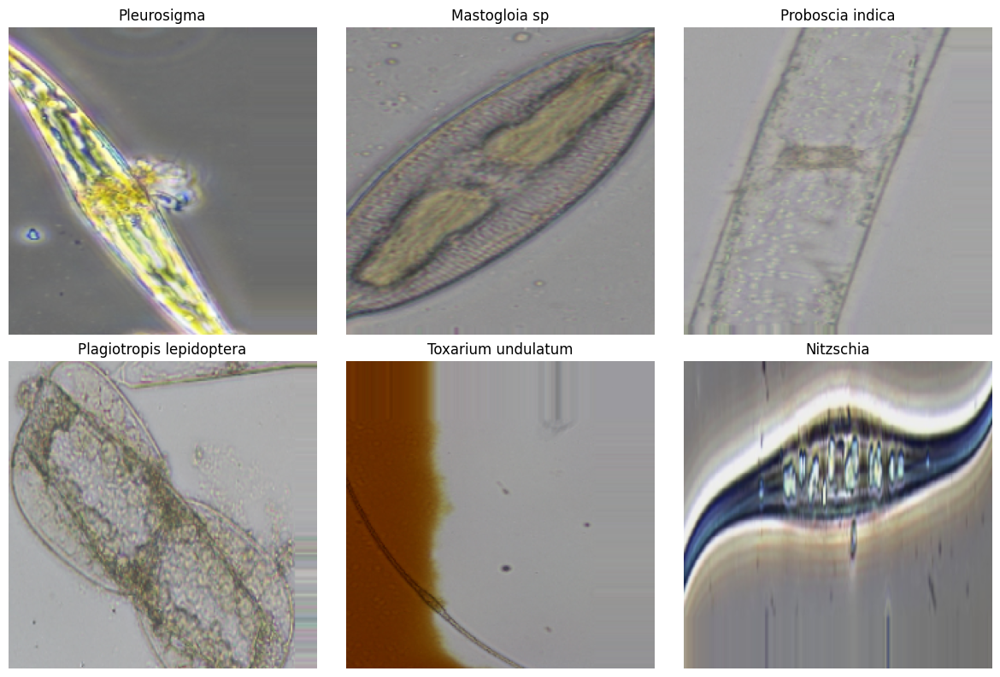

In [18]:
images, labels = next(train_generator)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))

for i, ax in enumerate(axes.flatten()):
    idx = np.random.randint(0, images.shape[0])
    img = images[idx]
    label = labels[idx]
    
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(dict_labels[np.argmax(label)])

plt.tight_layout()
plt.show()

# **Modelling**

## **Transformers with Pretrained Model**

In [9]:
def build_model(pretrained):
    tfk.backend.clear_session()

    input = tfk.layers.Input(shape=(224, 224, 3))

    x = KerasLayer(
        pretrained,
        trainable=False
    )(input)
    x = tfk.layers.Flatten()(x)
    x = tfk.layers.Dropout(0.2)(x)

    vit = KerasLayer(
        "/kaggle/input/vision-transformer/tensorflow2/vit-s16-classification/1",
        trainable=False
    )(input)
    vit = tfk.layers.Flatten()(vit)
    vit = tfk.layers.Dropout(0.2)(vit)

    concat = tfk.layers.Concatenate()([x, vit])
    output = tfk.layers.Dense(26, activation='softmax')(concat)

    model = tfk.Model(inputs=input, outputs=output)
    
    model.compile(
        optimizer=tfk.optimizers.Adam(
            learning_rate=0.001,
            beta_1=0.9,
            beta_2=0.999,
            epsilon=1e-7,
        ),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )
    
    return model

In [10]:
def plot_history(history):
    train_accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    train_loss = history.history['loss']
    val_loss = history.history['val_loss']

    fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

    ax[0].set_title('Training Accuracy vs. Epochs')
    ax[0].plot(train_accuracy, 'o-', label='Train Accuracy')
    ax[0].plot(val_accuracy, 'o-', label='Validation Accuracy')
    ax[0].set_xlabel('Epochs')
    ax[0].set_ylabel('Accuracy')
    ax[0].legend(loc='best')

    ax[1].set_title('Training/Validation Loss vs. Epochs')
    ax[1].plot(train_loss, 'o-', label='Train Loss')
    ax[1].plot(val_loss, 'o-', label='Validation Loss')
    ax[1].set_xlabel('Epochs')
    ax[1].set_ylabel('Loss')
    ax[1].legend(loc='best')

    plt.tight_layout()
    plt.show()

In [11]:
IMG_WIDTH, IMG_HEIGHT = 224, 224

def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array, mode='tf', data_format=None)
    return img, img_array

def predict_image(model):
    base_path = '/kaggle/input/image-classification-pythoplankton-dataset/classification/testing'
    
    with open('/kaggle/working/labels.json', 'r') as label_file:
        class_names = json.load(label_file)
    
    selected_images = []
    for class_id, class_name in class_names.items():
        class_path = os.path.join(base_path, class_name)
        if os.path.isdir(class_path):
            img_files = os.listdir(class_path)
            if img_files: 
                img_file = img_files[0]
                img_path = os.path.join(class_path, img_file)
                selected_images.append((class_name, img_path))
            
    max_images = min(len(selected_images), 15)
    fig, axes = plt.subplots(3, 5, figsize=(20, 12))
    axes = axes.flatten()

    for idx in range(max_images):
        actual_class, img_path = selected_images[idx]
        img, img_array = load_and_preprocess_image(img_path)
        predictions = model.predict(img_array)
        predicted_class = np.argmax(predictions, axis=1)[0]
        predicted_class_name = class_names[str(predicted_class)]

        axes[idx].imshow(img)
        axes[idx].axis('off')
        color = 'red' if actual_class != predicted_class_name else 'black'
        axes[idx].set_title(f'Actual: {actual_class}\nPredicted: {predicted_class_name}', color=color)

    for idx in range(max_images, len(axes)):
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

In [36]:
def plot_confusion_matrix(model, model_name): 
    y_pred = np.argmax(model.predict(test_generator), axis=1).tolist()
    y_true = test_generator.classes.tolist()

    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.title(f'{model_name} Confusion Matrix')
    plt.show()

## **BigTransfer**

In [19]:
bit = build_model("/kaggle/input/bit/tensorflow2/m-r101x1/1")
bit.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 2048)                 4249248   ['input_1[0][0]']             
                                                          0                                       
                                                                                                  
 keras_layer_1 (KerasLayer)  (None, 1000)                 2205066   ['input_1[0][0]']             
                                                          4                                       
                                                                                              

In [20]:
bit_history = bit.fit(
    train_generator, epochs=50,
    validation_data=val_generator,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)],
    class_weight=class_weight
)

Epoch 1/50


I0000 00:00:1724153716.529612     209 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


8/8 [==============================] - ETA: 0s - loss: 5.2689 - accuracy: 0.1826

W0000 00:00:1724153733.718124     209 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


8/8 [==============================] - 67s 2s/step - loss: 5.2689 - accuracy: 0.1826 - val_loss: 2.1508 - val_accuracy: 0.6000
Epoch 2/50
8/8 [==============================] - 8s 1s/step - loss: 1.3427 - accuracy: 0.6761 - val_loss: 0.5475 - val_accuracy: 0.8800
Epoch 3/50
8/8 [==============================] - 9s 1s/step - loss: 0.2836 - accuracy: 0.8957 - val_loss: 0.2066 - val_accuracy: 0.9000
Epoch 4/50
8/8 [==============================] - 9s 1s/step - loss: 0.2066 - accuracy: 0.9109 - val_loss: 0.0861 - val_accuracy: 0.9600
Epoch 5/50
8/8 [==============================] - 8s 1s/step - loss: 0.0664 - accuracy: 0.9609 - val_loss: 0.4480 - val_accuracy: 0.8900
Epoch 6/50
8/8 [==============================] - 8s 950ms/step - loss: 0.0413 - accuracy: 0.9804 - val_loss: 0.2028 - val_accuracy: 0.9300
Epoch 7/50
8/8 [==============================] - 8s 987ms/step - loss: 0.0275 - accuracy: 0.9826 - val_loss: 0.1366 - val_accuracy: 0.9400
Epoch 8/50
8/8 [=============================

In [21]:
score = bit.evaluate(test_generator)
print("Loss: ", score[0])
print("Accuracy: ", score[1])

2/2 [==============================] - 4s 3s/step - loss: 0.0033 - accuracy: 1.0000
Loss:  0.003336635185405612
Accuracy:  1.0


W0000 00:00:1724153957.672345     209 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


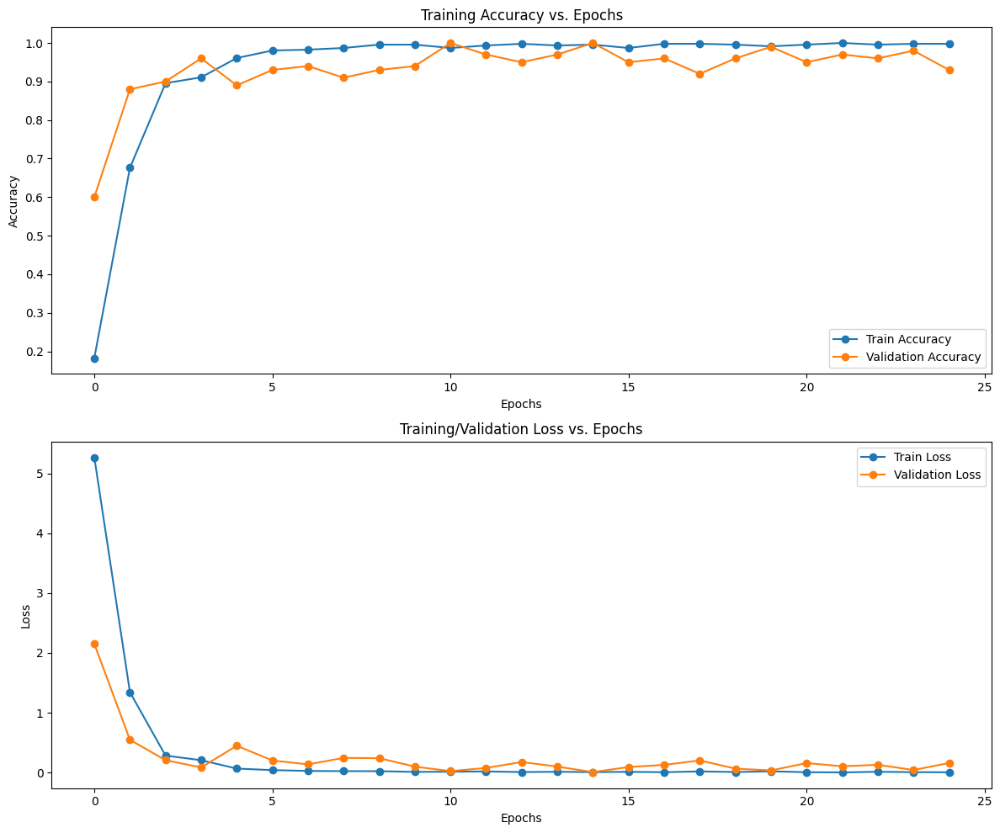

In [22]:
bit.save('bit_model_plankton')
plot_history(bit_history)

1/1 [==============================] - 0s 46ms/step


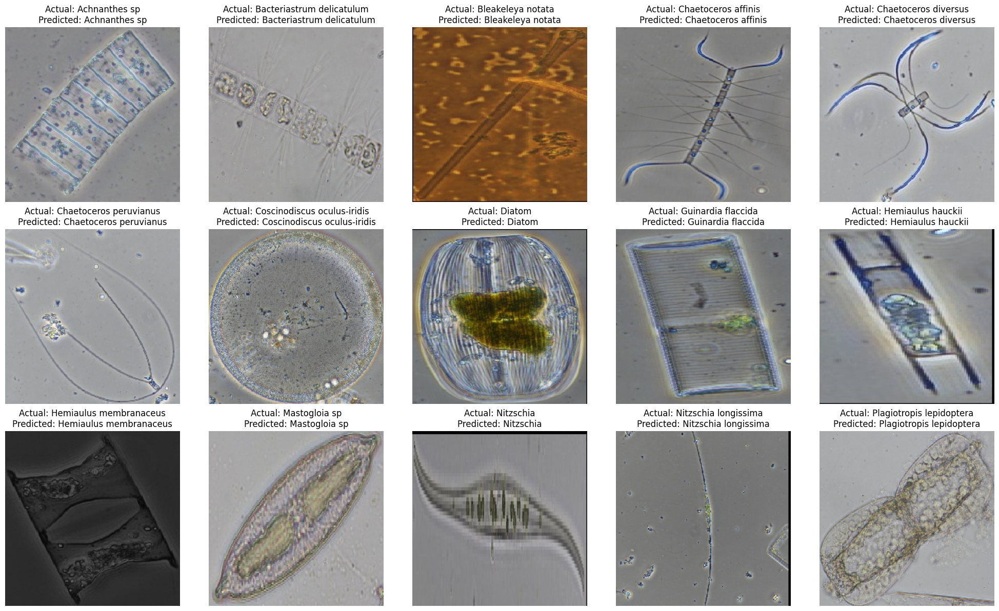

In [28]:
bit = tfk.models.load_model("/kaggle/working/bit_model_plankton")
predict_image(bit)

2/2 [==============================] - 1s 304ms/step


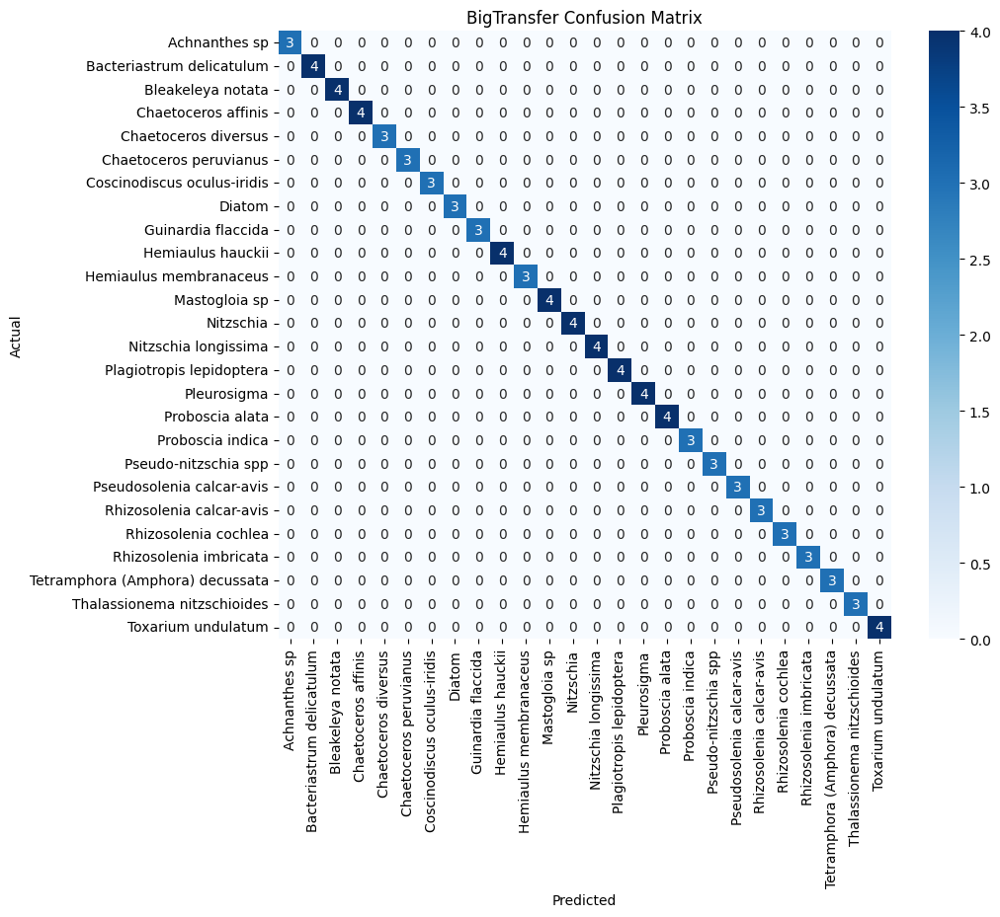

In [37]:
bit = tfk.models.load_model("/kaggle/working/bit_model_plankton")
plot_confusion_matrix(bit, "BigTransfer")

## **RegNet**

In [29]:
regnet = build_model("/kaggle/input/regnety/tensorflow2/800mf-classification/1")
regnet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 1000)                 6501119   ['input_1[0][0]']             
                                                                                                  
 keras_layer_1 (KerasLayer)  (None, 1000)                 2205066   ['input_1[0][0]']             
                                                          4                                       
                                                                                                  
 flatten (Flatten)           (None, 1000)                 0         ['keras_layer[0][0]']     

In [30]:
regnet_history = regnet.fit(
    train_generator, epochs=50,
    validation_data=val_generator,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)],
    class_weight=class_weight
)

Epoch 1/50
8/8 [==============================] - ETA: 0s - loss: 8.9389 - accuracy: 0.0609

W0000 00:00:1724154483.298263     206 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


8/8 [==============================] - 23s 2s/step - loss: 8.9389 - accuracy: 0.0609 - val_loss: 7.3901 - val_accuracy: 0.0700
Epoch 2/50
8/8 [==============================] - 7s 1s/step - loss: 6.2520 - accuracy: 0.1609 - val_loss: 2.7002 - val_accuracy: 0.4200
Epoch 3/50
8/8 [==============================] - 7s 903ms/step - loss: 3.9416 - accuracy: 0.2870 - val_loss: 2.7431 - val_accuracy: 0.3800
Epoch 4/50
8/8 [==============================] - 7s 917ms/step - loss: 2.7728 - accuracy: 0.3696 - val_loss: 2.1623 - val_accuracy: 0.5200
Epoch 5/50
8/8 [==============================] - 8s 937ms/step - loss: 1.8613 - accuracy: 0.4761 - val_loss: 0.8178 - val_accuracy: 0.7800
Epoch 6/50
8/8 [==============================] - 7s 898ms/step - loss: 1.3860 - accuracy: 0.6130 - val_loss: 1.0723 - val_accuracy: 0.6300
Epoch 7/50
8/8 [==============================] - 8s 946ms/step - loss: 1.1973 - accuracy: 0.5978 - val_loss: 0.4960 - val_accuracy: 0.8700
Epoch 8/50
8/8 [====================

In [31]:
score = regnet.evaluate(test_generator)
print("Loss: ", score[0])
print("Accuracy: ", score[1])

2/2 [==============================] - 3s 2s/step - loss: 0.0375 - accuracy: 0.9888
Loss:  0.0374896377325058
Accuracy:  0.9887640476226807


W0000 00:00:1724154726.678632     206 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


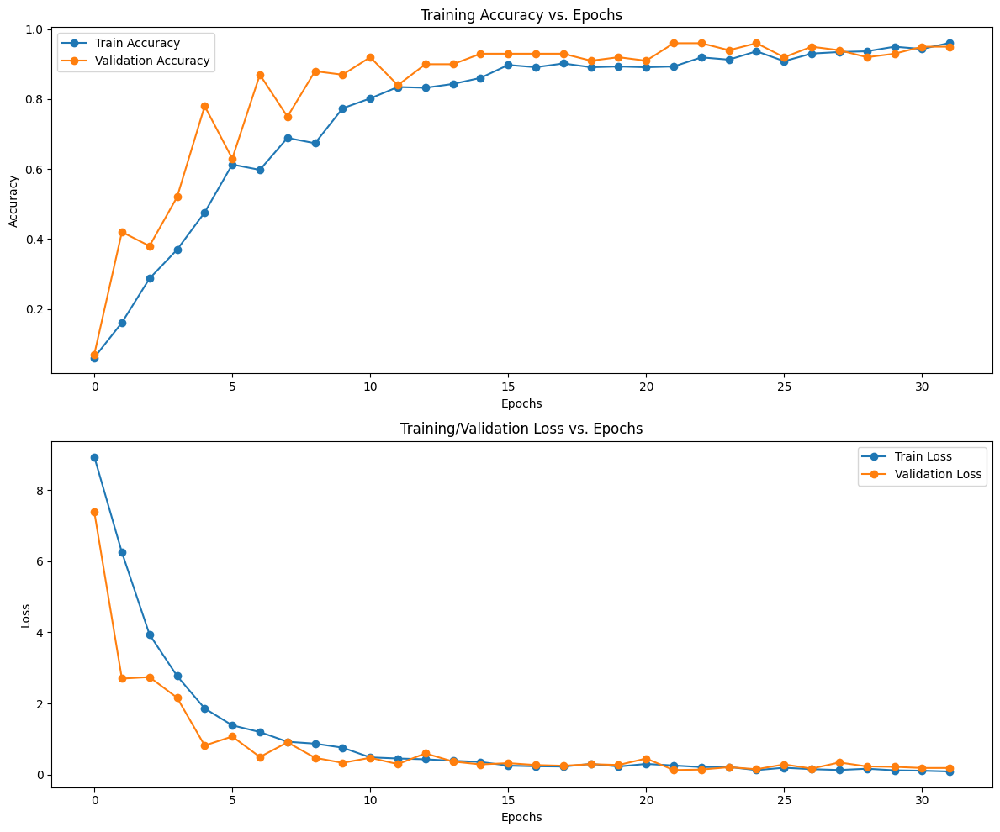

In [33]:
regnet.save('regnet_model_plankton')
plot_history(regnet_history)

1/1 [==============================] - 0s 25ms/step


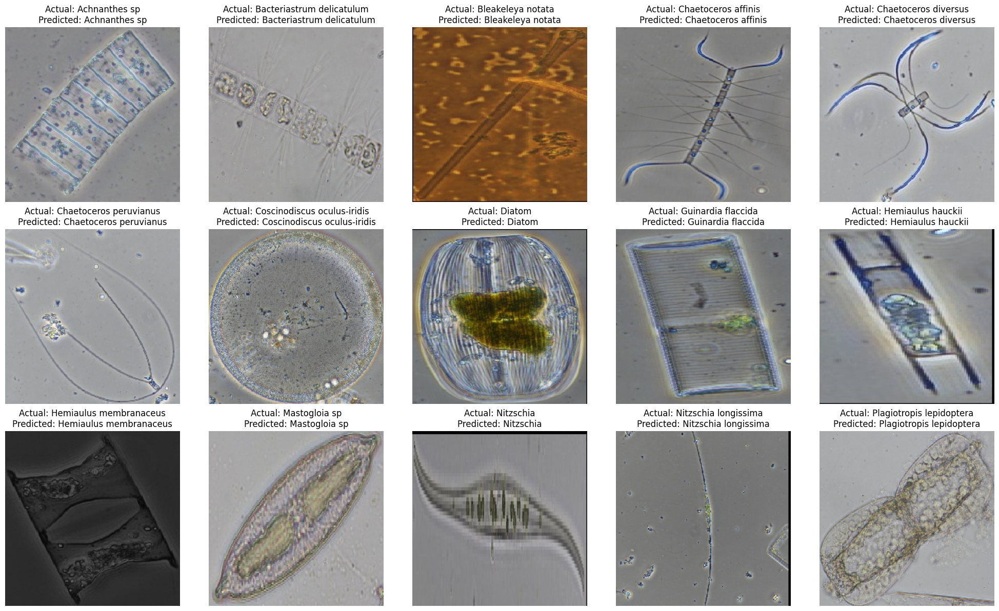

In [34]:
regnet = tfk.models.load_model("/kaggle/working/regnet_model_plankton")
predict_image(regnet)

2/2 [==============================] - 0s 162ms/step


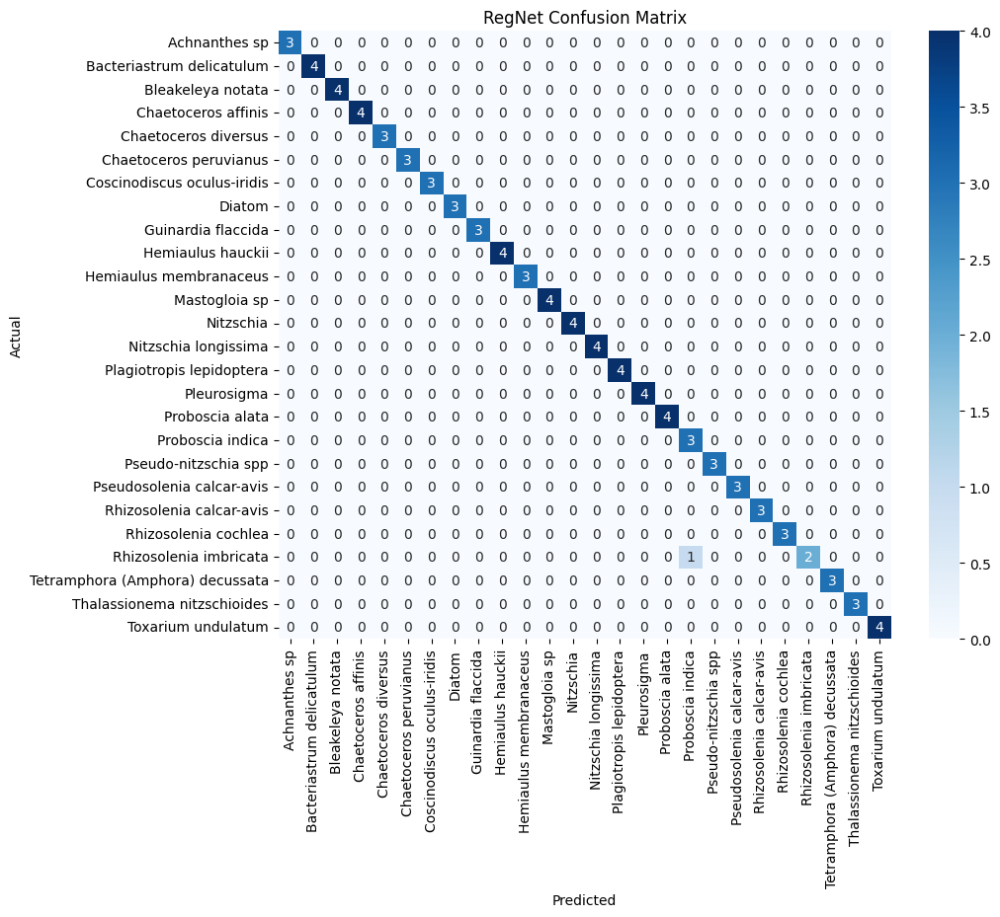

In [38]:
regnet = tfk.models.load_model("/kaggle/working/regnet_model_plankton")
plot_confusion_matrix(regnet, "RegNet")

## **Swin Transformers**

In [35]:
swin = build_model("/kaggle/input/swin/tensorflow2/s3-tiny-224/1")
swin.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 1000)                 2832867   ['input_1[0][0]']             
                                                          4                                       
                                                                                                  
 keras_layer_1 (KerasLayer)  (None, 1000)                 2205066   ['input_1[0][0]']             
                                                          4                                       
                                                                                              

In [36]:
swin_history = swin.fit(
    train_generator, epochs=50,
    validation_data=val_generator,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)],
    class_weight=class_weight
)

Epoch 1/50
8/8 [==============================] - ETA: 0s - loss: 3.8397 - accuracy: 0.1630

W0000 00:00:1724154939.092803     207 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


8/8 [==============================] - 27s 2s/step - loss: 3.8397 - accuracy: 0.1630 - val_loss: 2.4563 - val_accuracy: 0.3400
Epoch 2/50
8/8 [==============================] - 8s 965ms/step - loss: 1.7038 - accuracy: 0.4935 - val_loss: 1.2932 - val_accuracy: 0.7100
Epoch 3/50
8/8 [==============================] - 8s 990ms/step - loss: 0.7778 - accuracy: 0.7543 - val_loss: 0.6772 - val_accuracy: 0.7900
Epoch 4/50
8/8 [==============================] - 8s 975ms/step - loss: 0.4341 - accuracy: 0.8609 - val_loss: 0.4671 - val_accuracy: 0.9100
Epoch 5/50
8/8 [==============================] - 8s 926ms/step - loss: 0.2587 - accuracy: 0.9043 - val_loss: 0.4703 - val_accuracy: 0.8900
Epoch 6/50
8/8 [==============================] - 8s 1s/step - loss: 0.1671 - accuracy: 0.9370 - val_loss: 0.3092 - val_accuracy: 0.9300
Epoch 7/50
8/8 [==============================] - 8s 943ms/step - loss: 0.1246 - accuracy: 0.9696 - val_loss: 0.3410 - val_accuracy: 0.9300
Epoch 8/50
8/8 [====================

In [37]:
score = swin.evaluate(test_generator)
print("Loss: ", score[0])
print("Accuracy: ", score[1])

2/2 [==============================] - 3s 2s/step - loss: 0.0163 - accuracy: 1.0000


W0000 00:00:1724155213.554323     208 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


Loss:  0.01625477336347103
Accuracy:  1.0


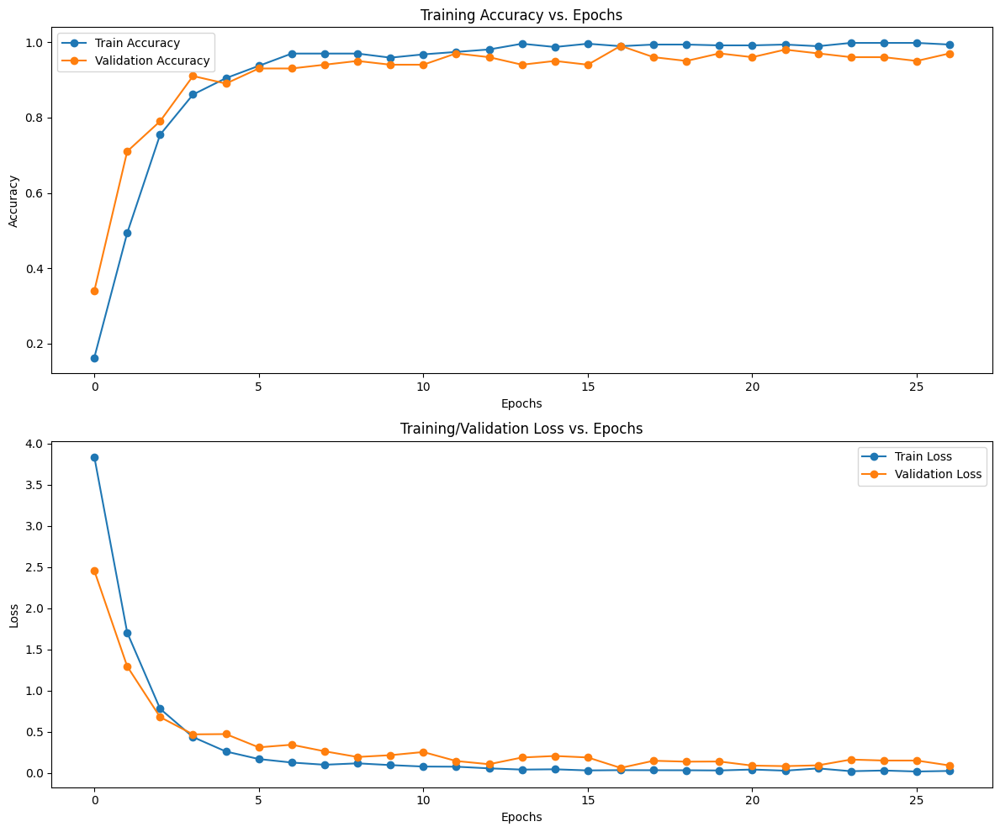

In [38]:
swin.save('swin_model_plankton')
plot_history(swin_history)

1/1 [==============================] - 0s 47ms/step


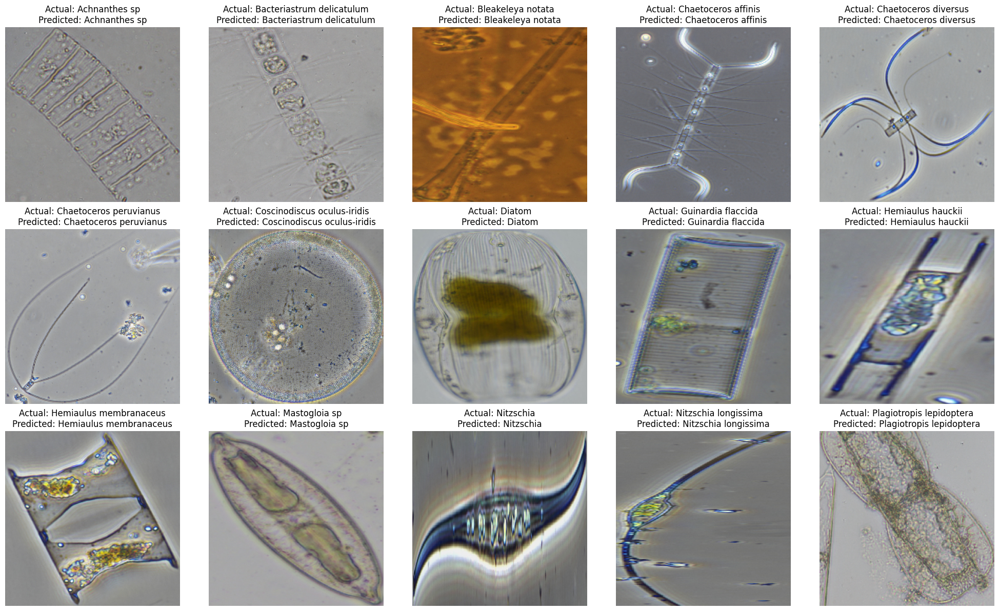

In [27]:
swin = tfk.models.load_model("/kaggle/working/swin_model_plankton")
predict_image(swin)

2/2 [==============================] - 1s 173ms/step


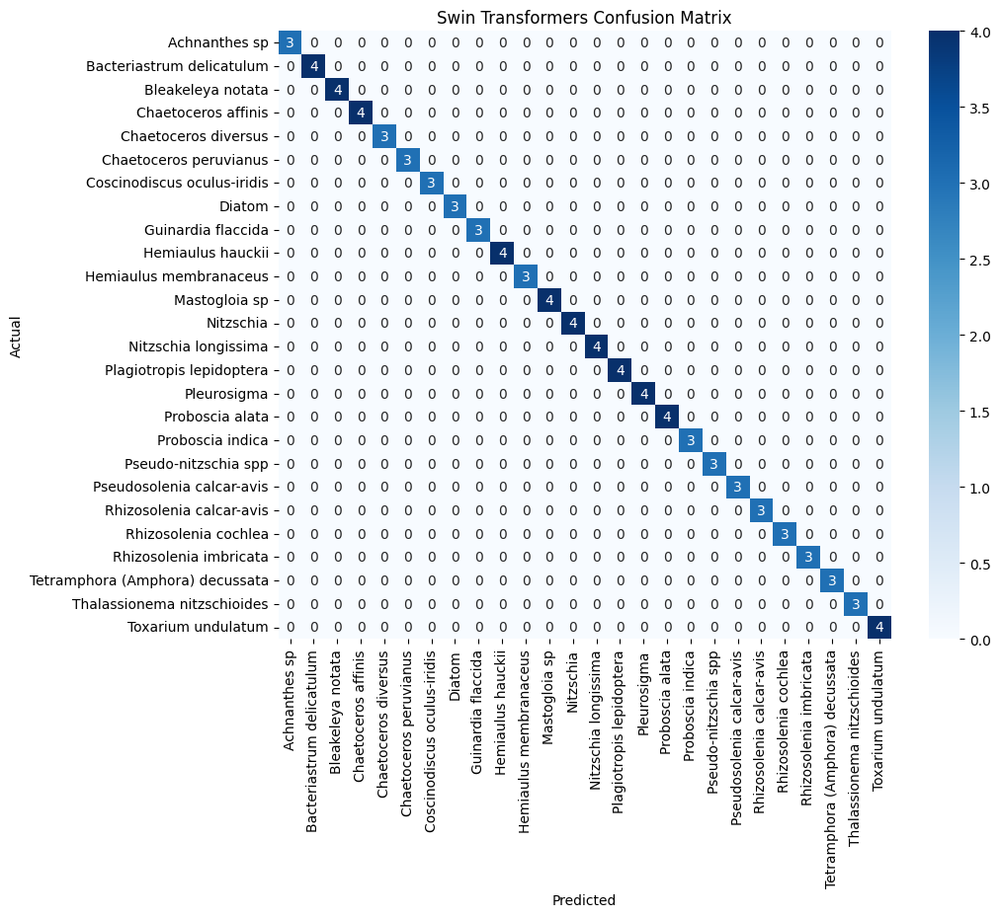

In [39]:
swin = tfk.models.load_model("/kaggle/working/swin_model_plankton")
plot_confusion_matrix(swin, "Swin Transformers")

## **ConvNeXt**

In [39]:
conv = build_model("/kaggle/input/convnext/tensorflow2/tiny-1k-224/1")
conv.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 1000)                 2858912   ['input_1[0][0]']             
                                                          8                                       
                                                                                                  
 keras_layer_1 (KerasLayer)  (None, 1000)                 2205066   ['input_1[0][0]']             
                                                          4                                       
                                                                                              

In [40]:
conv_history = conv.fit(
    train_generator, epochs=50,
    validation_data=val_generator,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)],
    class_weight=class_weight
)

Epoch 1/50
8/8 [==============================] - ETA: 0s - loss: 3.6842 - accuracy: 0.2043

W0000 00:00:1724155297.584233     208 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


8/8 [==============================] - 27s 2s/step - loss: 3.6842 - accuracy: 0.2043 - val_loss: 1.6247 - val_accuracy: 0.4700
Epoch 2/50
8/8 [==============================] - 8s 974ms/step - loss: 1.2722 - accuracy: 0.6261 - val_loss: 0.7948 - val_accuracy: 0.8400
Epoch 3/50
8/8 [==============================] - 8s 990ms/step - loss: 0.4527 - accuracy: 0.8652 - val_loss: 0.5283 - val_accuracy: 0.8300
Epoch 4/50
8/8 [==============================] - 8s 981ms/step - loss: 0.2036 - accuracy: 0.9261 - val_loss: 0.2872 - val_accuracy: 0.9100
Epoch 5/50
8/8 [==============================] - 8s 1s/step - loss: 0.1708 - accuracy: 0.9435 - val_loss: 0.2644 - val_accuracy: 0.9400
Epoch 6/50
8/8 [==============================] - 8s 954ms/step - loss: 0.1651 - accuracy: 0.9522 - val_loss: 0.2092 - val_accuracy: 0.9300
Epoch 7/50
8/8 [==============================] - 8s 950ms/step - loss: 0.0946 - accuracy: 0.9848 - val_loss: 0.1945 - val_accuracy: 0.9400
Epoch 8/50
8/8 [====================

In [41]:
score = conv.evaluate(test_generator)
print("Loss: ", score[0])
print("Accuracy: ", score[1])

1/2 [==============>...............] - ETA: 0s - loss: 0.0213 - accuracy: 1.0000

W0000 00:00:1724155481.148662     206 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


2/2 [==============================] - 3s 3s/step - loss: 0.0174 - accuracy: 1.0000
Loss:  0.01737130619585514
Accuracy:  1.0


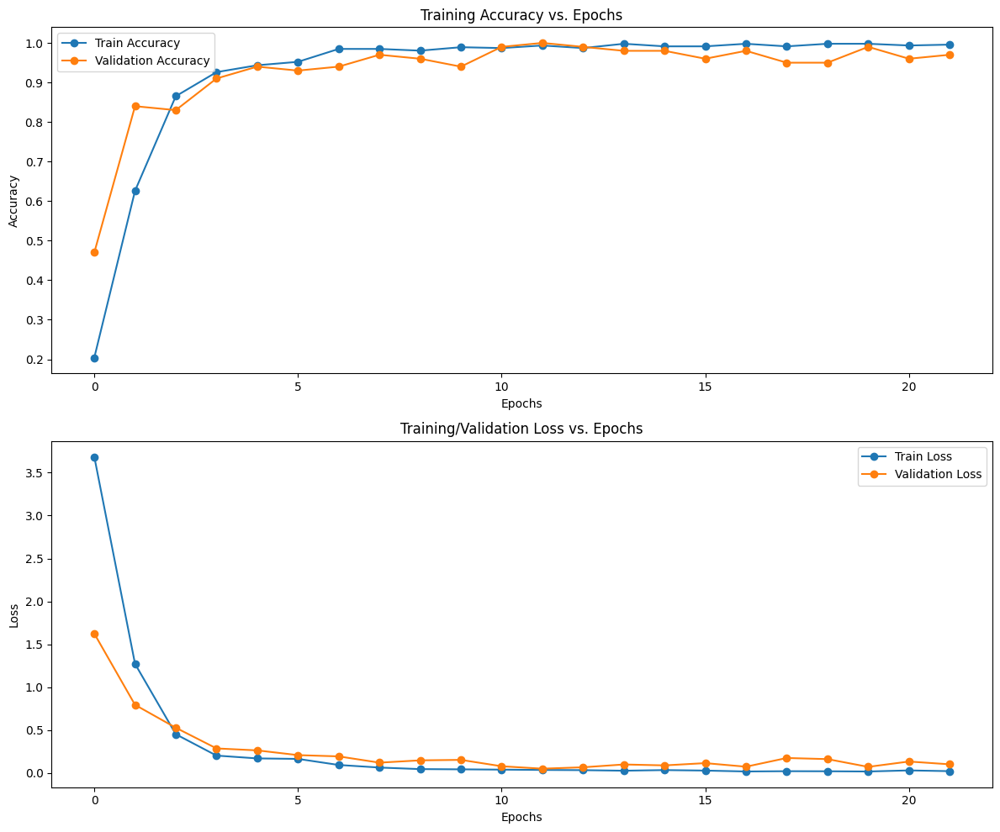

In [42]:
conv.save('conv_model_plankton')
plot_history(conv_history)

1/1 [==============================] - 0s 40ms/step


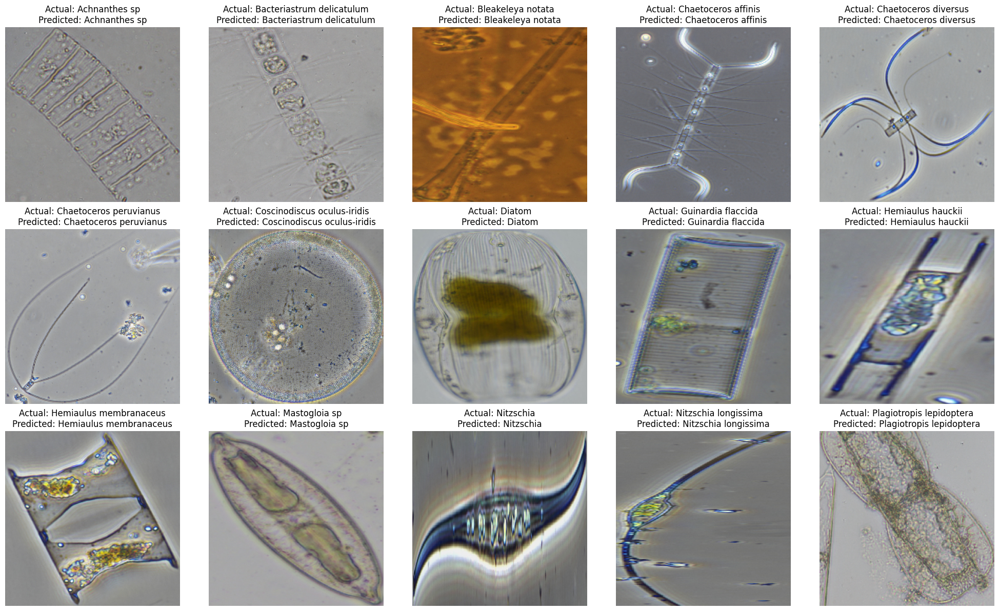

In [28]:
conv = tfk.models.load_model("/kaggle/working/conv_model_plankton")
predict_image(conv)

2/2 [==============================] - 1s 163ms/step


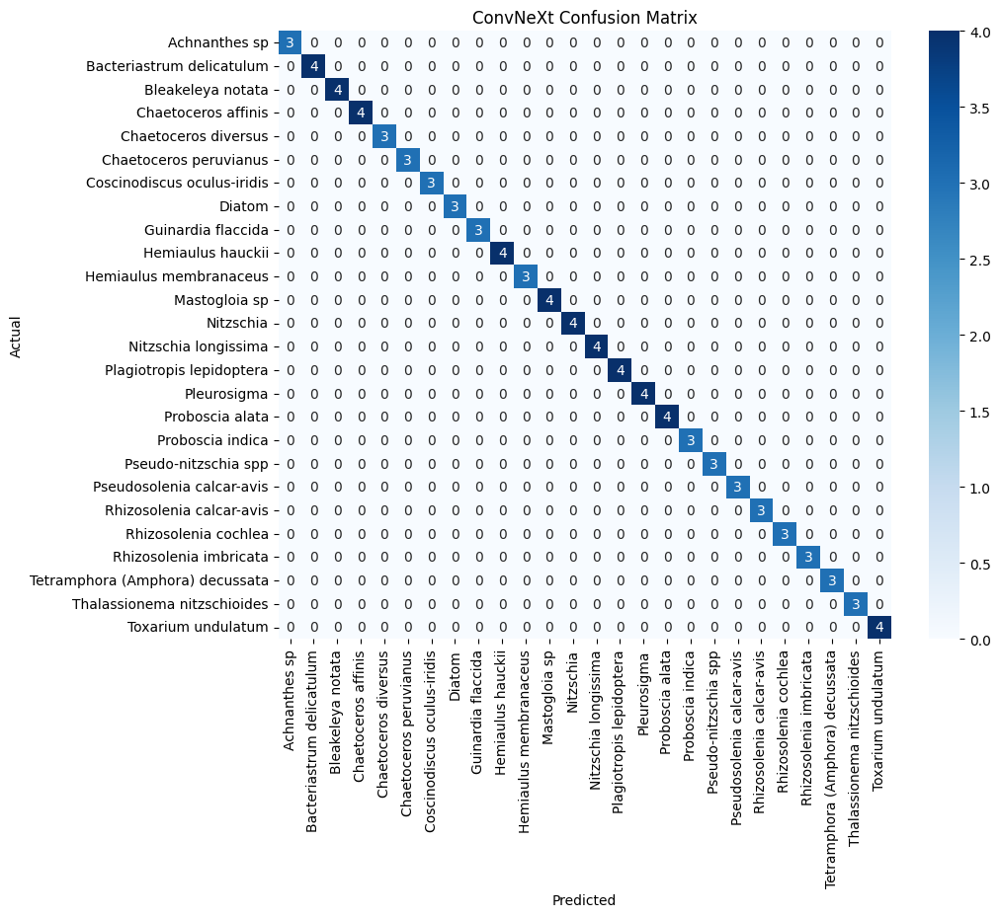

In [40]:
conv = tfk.models.load_model("/kaggle/working/conv_model_plankton")
plot_confusion_matrix(conv, "ConvNeXt")

## **Vision Transformers**

In [12]:
vit = build_model("/kaggle/input/vision-transformer/tensorflow2/vit-r26-s32-medaug-fe/1")
vit.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 keras_layer (KerasLayer)    (None, 384)                  3604691   ['input_1[0][0]']             
                                                          2                                       
                                                                                                  
 keras_layer_1 (KerasLayer)  (None, 1000)                 2205066   ['input_1[0][0]']             
                                                          4                                       
                                                                                              

In [13]:
vit_history = vit.fit(
    train_generator, epochs=50,
    validation_data=val_generator,
    callbacks=[tfk.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)],
    class_weight=class_weight
)

Epoch 1/50


I0000 00:00:1724161917.699322     140 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


8/8 [==============================] - ETA: 0s - loss: 5.9760 - accuracy: 0.1478

W0000 00:00:1724161977.350422     142 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


8/8 [==============================] - 102s 7s/step - loss: 5.9760 - accuracy: 0.1478 - val_loss: 3.0914 - val_accuracy: 0.3300
Epoch 2/50
8/8 [==============================] - 9s 1s/step - loss: 1.9415 - accuracy: 0.4326 - val_loss: 0.9382 - val_accuracy: 0.7200
Epoch 3/50
8/8 [==============================] - 9s 1s/step - loss: 0.7378 - accuracy: 0.7304 - val_loss: 0.7073 - val_accuracy: 0.8400
Epoch 4/50
8/8 [==============================] - 9s 1s/step - loss: 0.4025 - accuracy: 0.8587 - val_loss: 0.3074 - val_accuracy: 0.8700
Epoch 5/50
8/8 [==============================] - 9s 1s/step - loss: 0.1838 - accuracy: 0.9043 - val_loss: 0.1828 - val_accuracy: 0.9200
Epoch 6/50
8/8 [==============================] - 9s 1s/step - loss: 0.1437 - accuracy: 0.9239 - val_loss: 0.2458 - val_accuracy: 0.9200
Epoch 7/50
8/8 [==============================] - 9s 1s/step - loss: 0.1063 - accuracy: 0.9457 - val_loss: 0.1425 - val_accuracy: 0.9200
Epoch 8/50
8/8 [==============================] - 

In [14]:
score = vit.evaluate(test_generator)
print("Loss: ", score[0])
print("Accuracy: ", score[1])

1/2 [==============>...............] - ETA: 0s - loss: 0.0020 - accuracy: 1.0000

W0000 00:00:1724162359.912201     140 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


2/2 [==============================] - 14s 14s/step - loss: 0.0015 - accuracy: 1.0000
Loss:  0.0015030461363494396
Accuracy:  1.0


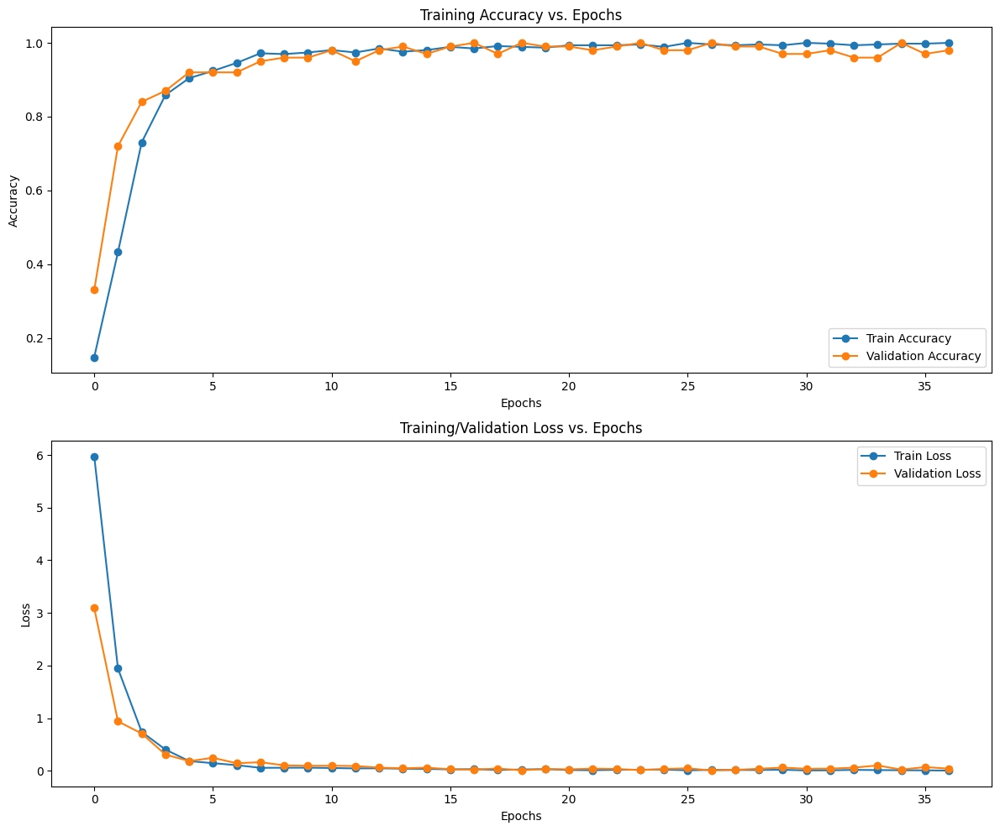

In [15]:
vit.save('vit_model_plankton')
plot_history(vit_history)

1/1 [==============================] - 0s 24ms/step


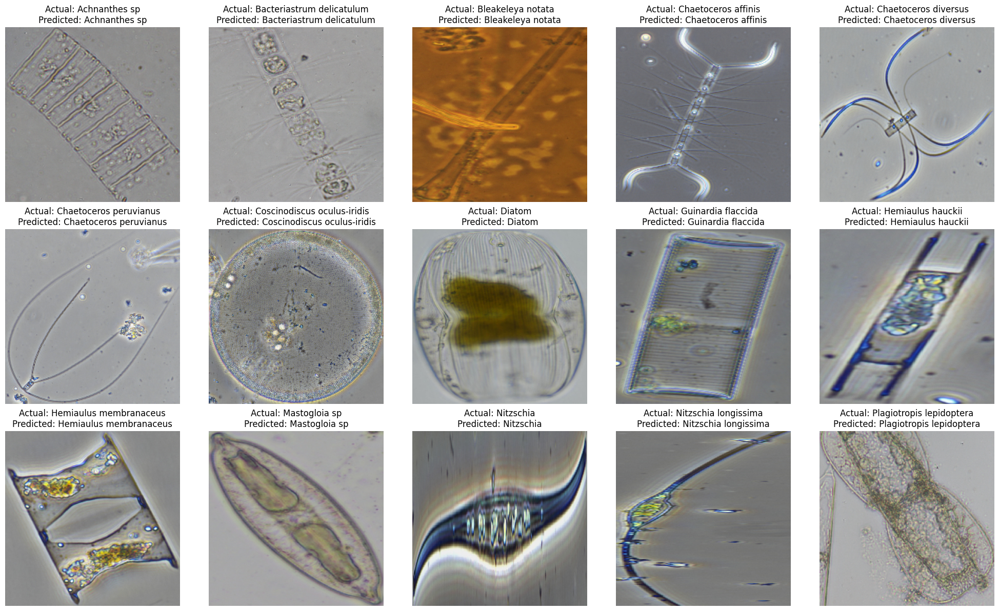

In [29]:
vit = tfk.models.load_model("/kaggle/working/vit_model_plankton")
predict_image(vit)

2/2 [==============================] - 1s 200ms/step


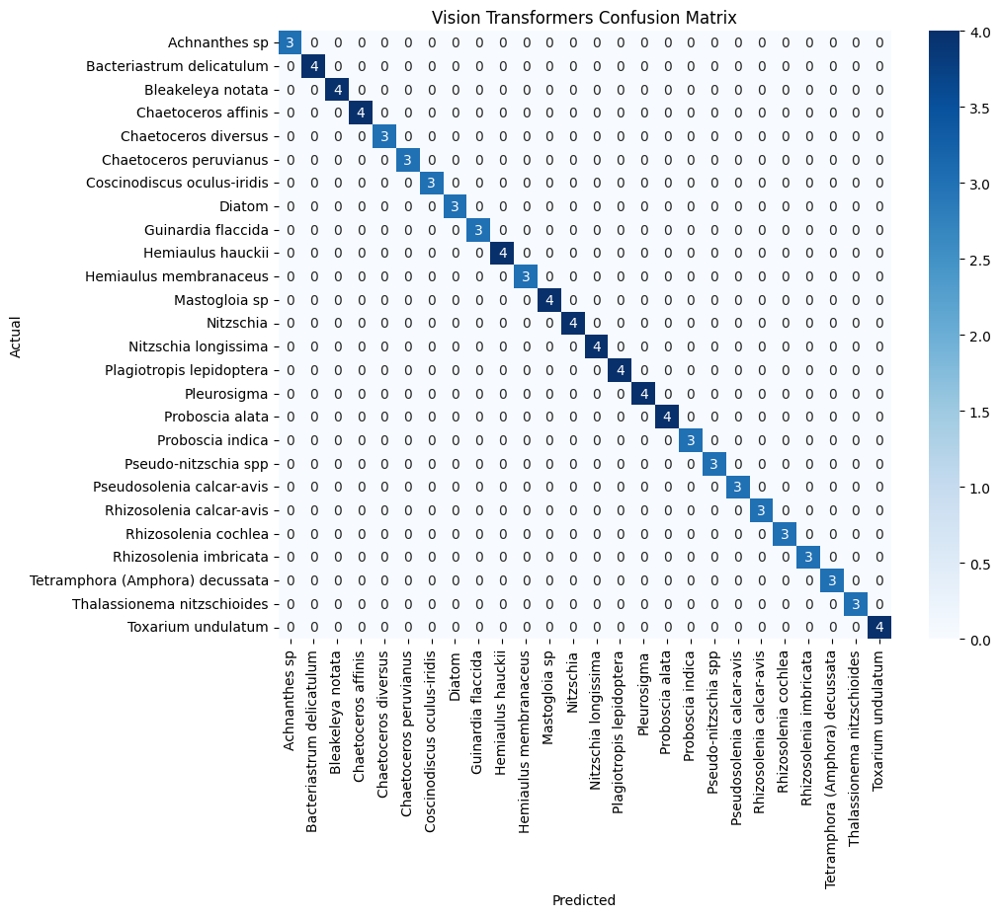

In [41]:
vit = tfk.models.load_model("/kaggle/working/vit_model_plankton")
plot_confusion_matrix(vit, "Vision Transformers")

# **Testing**

1/1 [==============================] - 7s 7s/step


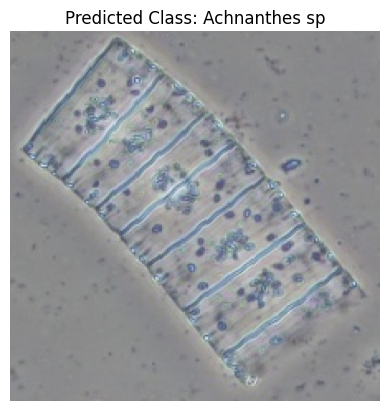

In [26]:
def load_model(model):
    if model == "vit":
        l_model = tfk.models.load_model('/kaggle/working/vit_model_plankton')
    elif model == "bit":
        l_model = tfk.models.load_model('/kaggle/working/bit_model_plankton')
    elif model == "swin":
        l_model = tfk.models.load_model('/kaggle/working/swin_model_plankton')
    elif model == "conv":
        l_model = tfk.models.load_model('/kaggle/working/conv_model_plankton')
    else:
        l_model = tfk.models.load_model('/kaggle/working/regnet_model_plankton')
    return l_model

with open('labels.json', 'r') as label_file:
    class_names = json.load(label_file)

IMG_WIDTH, IMG_HEIGHT = 224, 224
    
img_path = '/kaggle/input/image-classification-pythoplankton-dataset/classification/testing/Achnanthes sp/Achnanthes sp_1.jpg'

img = image.load_img(img_path, target_size=(IMG_WIDTH, IMG_HEIGHT))
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array, mode='tf', data_format=None)

predicted_class = np.argmax(load_model("bit").predict(img_array), axis=1)[0]

plt.imshow(img)
plt.title(f'Predicted Class: {class_names[str(predicted_class)]}')
plt.axis('off')
plt.show()